In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1. Load and transform the dataset<a class="anchor" id="1"></a>

In [2]:
import numpy as np
import pandas as pd
from pathlib import Path
import os.path
import matplotlib.pyplot as plt
from IPython.display import Image, display
import matplotlib.cm as cm
from sklearn.model_selection import train_test_split
import tensorflow as tf

In [3]:
image_dir = Path('/content/drive/MyDrive/Skripsi - Plant Leaf/Dataset - PlantLeafDataset - Split/train')

# Get filepaths and labels for jpg and jpeg formats
filepaths_jpg = list(image_dir.glob('**/*.jpg'))
filepaths_jpeg = list(image_dir.glob('**/*.jpeg'))

# Combine filepaths from both formats
filepaths = filepaths_jpg + filepaths_jpeg

# Extract labels
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

# Create a DataFrame
filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')
image_df = pd.concat([filepaths, labels], axis=1)

# Drop GT images
image_df = image_df[image_df['Label'].apply(lambda x: x[-2:] != 'GT')]

In [4]:
# Activate this code to use only 100 pictures for each label
# lst = []
# for l in image_df['Label'].unique():
#     lst.append(image_df[image_df['Label'] == l] .sample(100, random_state = 0))
# # Concatenate the DataFrames
# image_df = pd.concat(lst)


In [4]:
# Shuffle the DataFrame and reset index
image_df = image_df.sample(frac=1).reset_index(drop = True)

# Show the result
image_df.tail()

,Filepath,Label
12265,/content/drive/MyDrive/Skripsi - Plant Leaf/Da...,Padi_Bacterialblight
12266,/content/drive/MyDrive/Skripsi - Plant Leaf/Da...,Singkong_Brown_Streak_Disease
12267,/content/drive/MyDrive/Skripsi - Plant Leaf/Da...,Pisang_Cordana
12268,/content/drive/MyDrive/Skripsi - Plant Leaf/Da...,Tebu_Healthy
12269,/content/drive/MyDrive/Skripsi - Plant Leaf/Da...,Singkong_Brown_Streak_Disease


# 2. Display 15 pictures of the dataset<a class="anchor" id="2"></a>

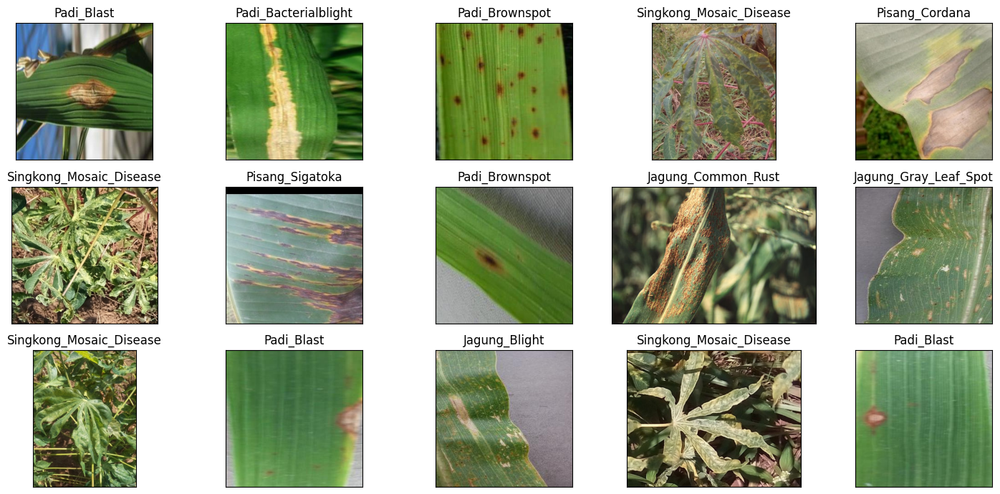

In [6]:
# Display 20 picture of the dataset with their labels
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 7),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[i]))
    ax.set_title(image_df.Label[i])
plt.tight_layout()
plt.show()

# 3. Load the Images with a generator<a class="anchor" id="3"></a>

In [5]:
# Separate in train and test data
train_df, test_df = train_test_split(image_df, train_size=0.8, shuffle=True, random_state=1)

In [ ]:
!unzip '/content/drive/MyDrive/Skripsi - Plant Leaf/Dataset/Dataset - PlantLeafDataset - Split.zip' -d '/content/drive/MyDrive/Skripsi - Plant Leaf/'

In [ ]:
base_dir = '/content/drive/MyDrive/Skripsi - Plant Leaf/Dataset - PlantLeafDataset - Split'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

In [6]:
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet_v2.preprocess_input,
    validation_split=0.2
)

test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet_v2.preprocess_input
)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

image_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
                    horizontal_flip=True)

test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
                    horizontal_flip=True)

# Rescale kalo resolusi gambar seragam
# Ga perlu rescale kalo resolusi beda-beda

train_generator = image_datagen.flow_from_directory(
        train_dir,
        target_size=(224, 224),
        batch_size=40,
        class_mode='categorical',
        color_mode='rgb',
        )

validation_generator = image_datagen.flow_from_directory(
        val_dir,
        target_size=(224, 224),
        batch_size=40,
        class_mode='categorical',
        color_mode='rgb',
        )

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(224, 224),
        batch_size=40,
        class_mode='categorical',
        color_mode='rgb',
        shuffle=False
        )

Found 14912 images belonging to 21 classes.
Found 1858 images belonging to 21 classes.
Found 1879 images belonging to 21 classes.


In [7]:
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

Found 7853 validated image filenames belonging to 21 classes.
Found 1963 validated image filenames belonging to 21 classes.
Found 2454 validated image filenames belonging to 21 classes.


In [ ]:
# Load the pretained model
pretrained_model = tf.keras.applications.EfficientNetV2B0(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

pretrained_model.trainable = False

# 4. Train the model<a class="anchor" id="4"></a>

In [ ]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(21, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=5,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_accuracy',
            patience=5,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ModelCheckpoint("/content/drive/MyDrive/Skripsi - Plant Leaf/Checkpoint/effNetV2CAM.h5",
                                           monitor='val_accuracy',
                                           verbose=1,
                                           save_best_only=True)
    ]
)

Epoch 1/5
246/246 [==============================] - ETA: 0s - loss: 0.8309 - accuracy: 0.7346
Epoch 1: val_accuracy improved from -inf to 0.85176, saving model to /content/drive/MyDrive/Skripsi - Plant Leaf/Checkpoint/effNetV2CAM.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


246/246 [==============================] - 2552s 10s/step - loss: 0.8309 - accuracy: 0.7346 - val_loss: 0.4552 - val_accuracy: 0.8518
Epoch 2/5
246/246 [==============================] - ETA: 0s - loss: 0.4156 - accuracy: 0.8584
Epoch 2: val_accuracy improved from 0.85176 to 0.85736, saving model to /content/drive/MyDrive/Skripsi - Plant Leaf/Checkpoint/effNetV2CAM.h5
246/246 [==============================] - 337s 1s/step - loss: 0.4156 - accuracy: 0.8584 - val_loss: 0.4090 - val_accuracy: 0.8574
Epoch 3/5
246/246 [==============================] - ETA: 0s - loss: 0.3389 - accuracy: 0.8835
Epoch 3: val_accuracy improved from 0.85736 to 0.87264, saving model to /content/drive/MyDrive/Skripsi - Plant Leaf/Checkpoint/effNetV2CAM.h5
246/246 [==============================] - 348s 1s/step - loss: 0.3389 - accuracy: 0.8835 - val_loss: 0.3737 - val_accuracy: 0.8726
Epoch 4/5
246/246 [==============================] - ETA: 0s - loss: 0.2952 - accuracy: 0.8994
Epoch 4: val_accuracy improved fr

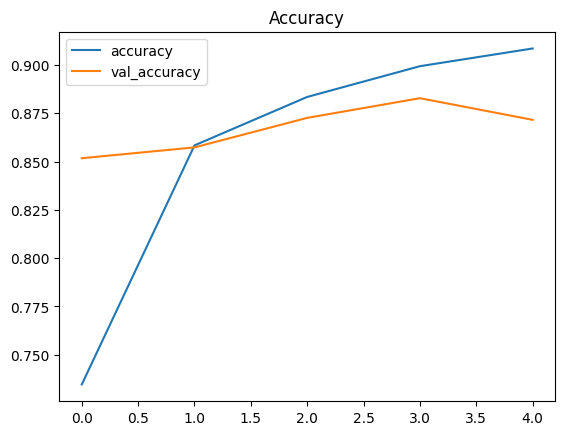

In [ ]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

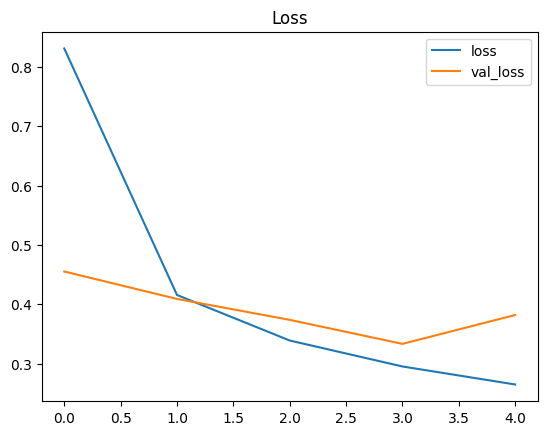

In [ ]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

In [ ]:
model.save("/content/drive/MyDrive/Skripsi - Plant Leaf/Checkpoint/mnet.h5", save_format='h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


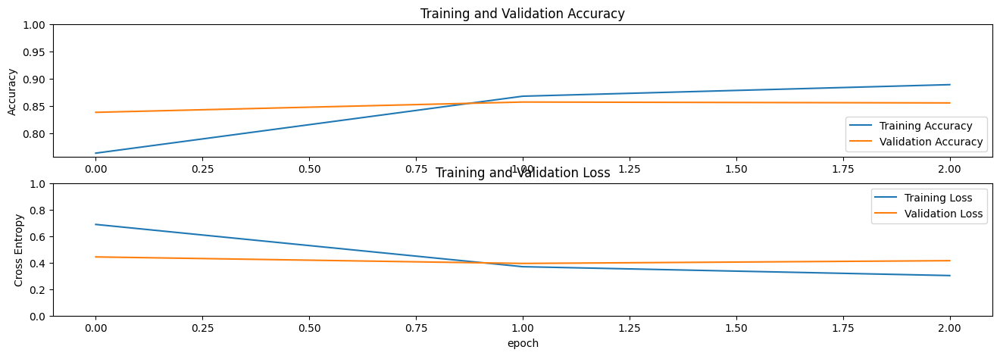

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 5))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [9]:
from tensorflow.keras.models import load_model
model = load_model("/content/drive/MyDrive/Skripsi - Plant Leaf/Checkpoint/mnet.h5")

# 5. Visualize the result<a class="anchor" id="5"></a>

In [ ]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.38791
Test Accuracy: 87.16%


In [10]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

77/77 [==============================] - 851s 11s/step
The first 5 predictions: ['Jagung_Gray_Leaf_Spot', 'Jagung_Gray_Leaf_Spot', 'Padi_Blast', 'Jagung_Gray_Leaf_Spot', 'Jagung_Gray_Leaf_Spot']


In [11]:
from sklearn.metrics import classification_report
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                               precision    recall  f1-score   support

                Jagung_Blight       0.00      0.00      0.00        52
           Jagung_Common_Rust       0.00      0.00      0.00        13
        Jagung_Gray_Leaf_Spot       0.01      0.80      0.01        15
               Jagung_Healthy       1.00      0.01      0.01       194
         Padi_Bacterialblight       0.00      0.00      0.00       214
                   Padi_Blast       0.19      0.13      0.15       175
               Padi_Brownspot       0.00      0.00      0.00       259
               Pisang_Cordana       0.00      0.00      0.00        72
               Pisang_Healthy       0.10      0.20      0.13        46
        Pisang_Pestalotiopsis       0.00      0.00      0.00        61
              Pisang_Sigatoka       0.02      0.08      0.04        64
    Singkong_Bacterial_Blight       0.00      0.00      0.00        64
Singkong_Brown_Streak_Disease       0.00      0.00      0.00       247
     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


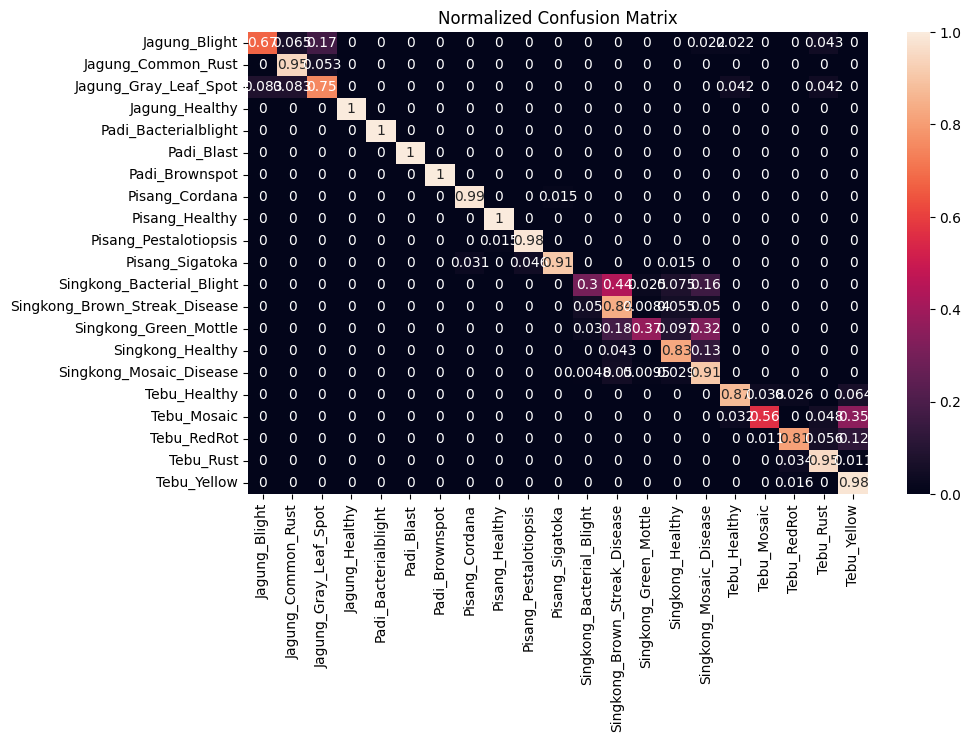

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (10,6))
sns.heatmap(cf_matrix, annot=True, xticklabels = sorted(set(y_test)), yticklabels = sorted(set(y_test)))
plt.title('Normalized Confusion Matrix')
plt.show()

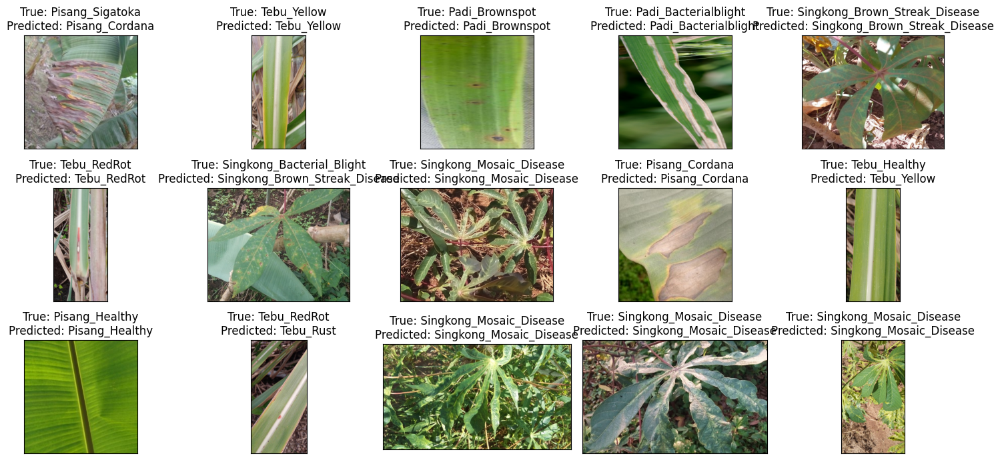

In [ ]:
# Display 15 picture of the dataset with their labels
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 7),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

In [ ]:
results = model.evaluate(test_generator, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

In [ ]:
# Predict the label of the test_images
pred = model.predict(test_generator)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

In [ ]:
from sklearn.metrics import classification_report
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (10,6))
sns.heatmap(cf_matrix, annot=True, xticklabels = sorted(set(y_test)), yticklabels = sorted(set(y_test)))
plt.title('Normalized Confusion Matrix')
plt.show()

## Examples of prediction

In [ ]:
# Display 15 picture of the dataset with their labels
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 7),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

# 6. Class activation heatmap for image classification<a class="anchor" id="6"></a>
## Grad-CAM class activation visualization
*Code adapted from keras.io*

In [17]:
 from tensorflow.keras.models import load_model

 model = load_model("/content/drive/MyDrive/Skripsi - Plant Leaf/Checkpoint/effNetV2CAM.h5")

In [18]:
def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size "size"
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
#     display(Image(cam_path))

    return cam_path

preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

last_conv_layer_name = "Conv_1"
img_size = (224,224)

# Remove last layer's softmax
model.layers[-1].activation = None

In [ ]:
# Get filepaths and labels
image_dir = Path('/content/drive/MyDrive/Skripsi - Plant Leaf/Dataset - PlantLeafDataset - Split/test/')
filepaths = list(image_dir.glob(r'**/*.jpg'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

# Drop GT images
image_df = image_df[image_df['Label'].apply(lambda x: x[-2:] != 'GT')]

In [ ]:
image_df = image_df.sample(frac=1).reset_index(drop = True)

# Show the result
image_df.head(3)

,Filepath,Label
0,/content/drive/MyDrive/Skripsi - Plant Leaf/Da...,Singkong_Green_Mottle
1,/content/drive/MyDrive/Skripsi - Plant Leaf/Da...,Singkong_Brown_Streak_Disease
2,/content/drive/MyDrive/Skripsi - Plant Leaf/Da...,Padi_Bacterialblight


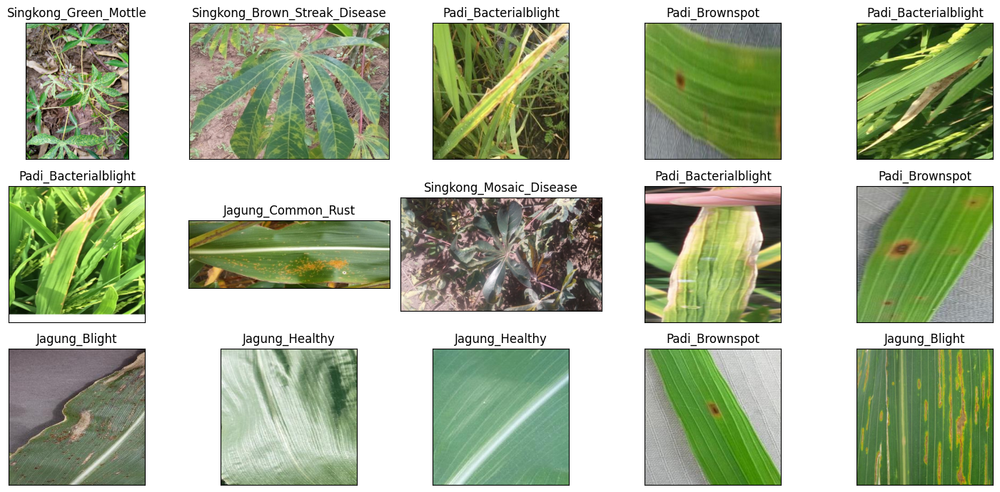

In [ ]:
# Display 20 picture of the dataset with their labels
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 7),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[i]))
    ax.set_title(image_df.Label[i])
plt.tight_layout()
plt.show()

In [ ]:
train_df, test_df = train_test_split(image_df, train_size=0.9, shuffle=True, random_state=1)

In [ ]:
pred = model.predict_generator(test_generator)
pred = np.argmax(pred, axis=1)

# Map the label
labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

<ipython-input-20-f8b0e692e56f>:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


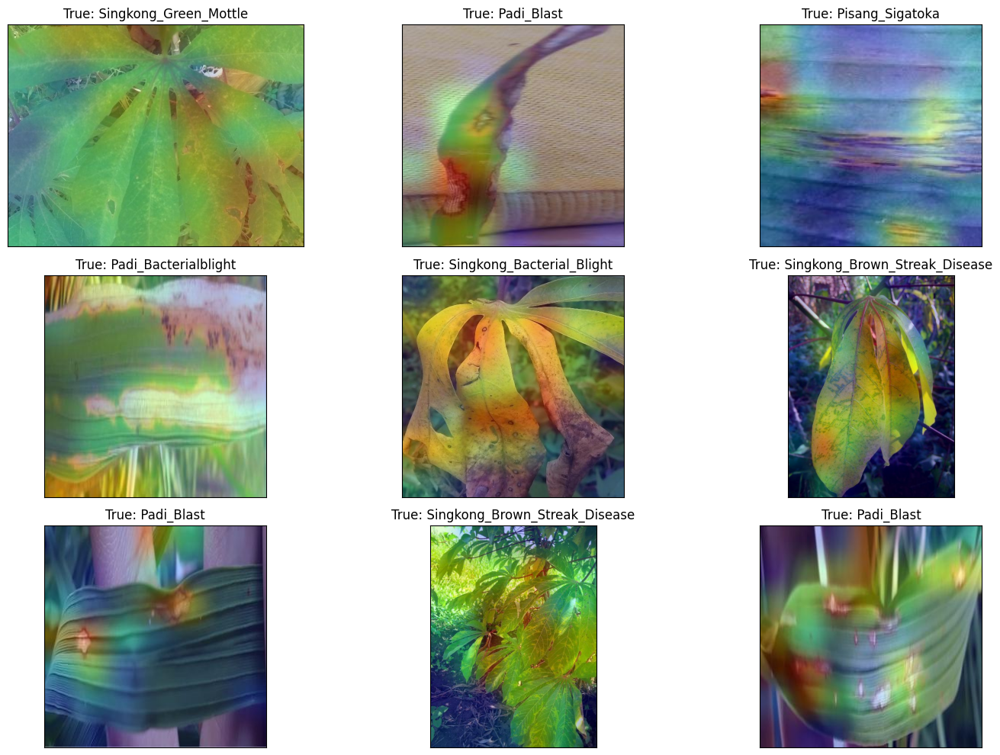

In [21]:
# Display the part of the pictures used by the neural network to classify the pictures
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img_path = test_df.Filepath.iloc[i]
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    ax.imshow(plt.imread(cam_path))
    ax.set_title(f"True: {test_df.Label.iloc[i]}")
    # ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

In [20]:
def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size "size"
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
#     display(Image(cam_path))

    return cam_path

preprocess_input = tf.keras.applications.efficientnet_v2.preprocess_input
decode_predictions = tf.keras.applications.efficientnet_v2.decode_predictions

last_conv_layer_name = "top_conv"
img_size = (224,224)

# Remove last layer's softmax
model.layers[-1].activation = None

<ipython-input-20-f8b0e692e56f>:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


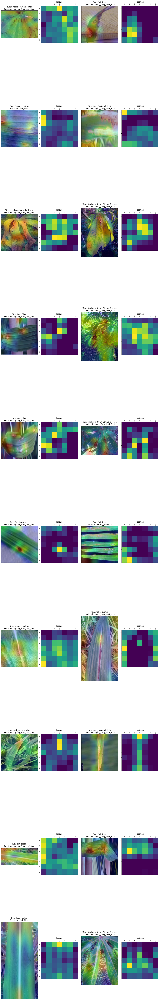

In [22]:
# Display the part of the pictures used by the neural network to classify the pictures
num_cols = 2
num_rows = min(10, len(test_df) // num_cols)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols * 2, figsize=(15, 10 * num_rows),
                         subplot_kw={'xticks': [], 'yticks': []})

for i in range(num_rows):
    # Get the indices for the current row
    row_indices = range(i * num_cols, (i + 1) * num_cols)

    for j, col_index in enumerate(row_indices):
        if col_index < len(test_df):
            # Get the image path and true label
            img_path = test_df.Filepath.iloc[col_index]
            true_label = test_df.Label.iloc[col_index]

            # Prepare image
            img_array = preprocess_input(get_img_array(img_path, size=img_size))

            # Generate class activation heatmap
            heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

            # Display Grad-CAM and heatmap side by side
            cam_path = save_and_display_gradcam(img_path, heatmap)

            # Determine the correct subplot position
            axes[i, j * 2].imshow(plt.imread(cam_path))
            axes[i, j * 2].set_title(f"True: {true_label}\nPredicted: {pred[col_index]}")

            axes[i, j * 2 + 1].matshow(heatmap, cmap='viridis')  # You can choose a different colormap
            axes[i, j * 2 + 1].set_title("Heatmap")

# Adjust layout
plt.tight_layout()
plt.show()

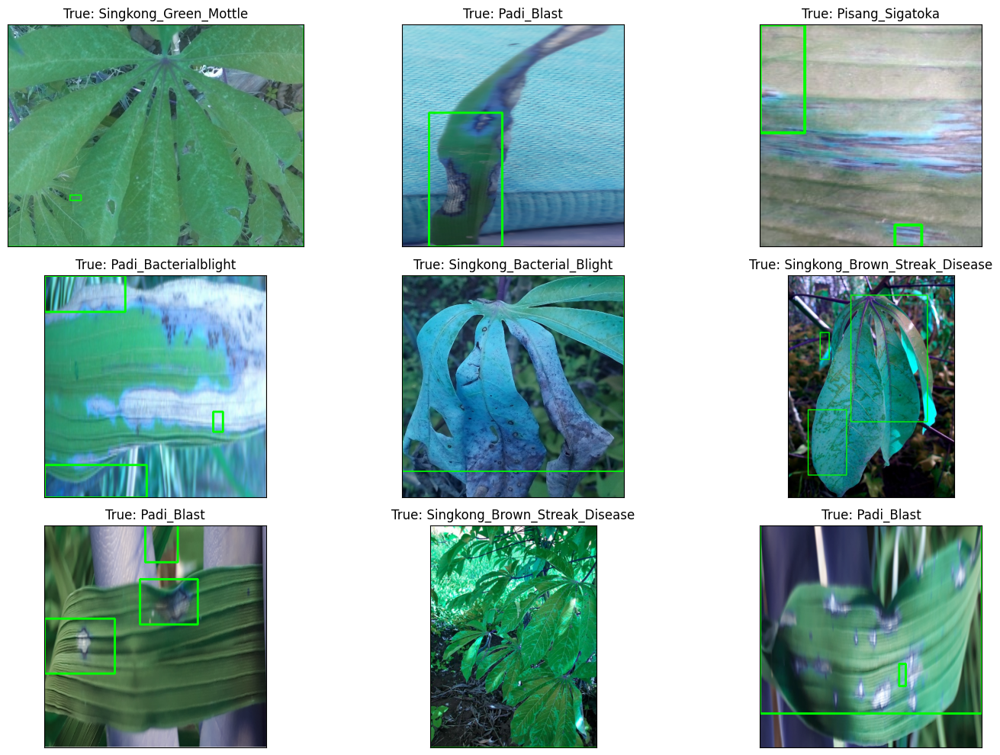

In [25]:
import cv2
import numpy as np

# Function to create bounding box based on heatmap
def create_bounding_box(img_path, heatmap, threshold=0.5):
    # Load the original image
    original_img = cv2.imread(img_path)

    # Resize the heatmap to match the original image size
    heatmap_resized = cv2.resize(heatmap, (original_img.shape[1], original_img.shape[0]))

    # Threshold the heatmap to get the areas with high activation
    thresholded_heatmap = np.where(heatmap_resized > threshold, 1.0, 0.0)

    # Find contours in the thresholded heatmap
    contours, _ = cv2.findContours(np.uint8(thresholded_heatmap), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a copy of the original image to draw bounding boxes
    img_with_boxes = original_img.copy()

    # Iterate through contours and draw bounding boxes
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(img_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)

    return img_with_boxes

# Display multiple images with bounding boxes
num_cols = 3
num_rows = 3

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 10),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img_path = test_df.Filepath.iloc[i]
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    img_with_boxes = create_bounding_box(img_path, heatmap)

    ax.imshow(img_with_boxes)
    ax.set_title(f"True: {test_df.Label.iloc[i]}")

plt.tight_layout()
plt.show()

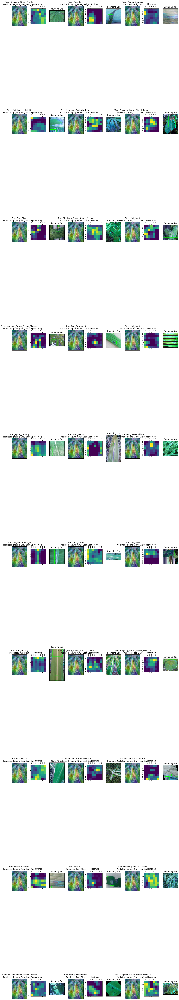

In [28]:
# Display Grad-CAM, heatmap, and bounding box side by side
num_cols = 3
num_rows = min(10, len(test_df) // num_cols)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols * 3, figsize=(15, 10 * num_rows),
                         subplot_kw={'xticks': [], 'yticks': []})

for i in range(num_rows):
    # Get the indices for the current row
    row_indices = range(i * num_cols, (i + 1) * num_cols)

    for j, col_index in enumerate(row_indices):
        if col_index < len(test_df):
            # Get the image path and true label
            img_path = test_df.Filepath.iloc[col_index]
            true_label = test_df.Label.iloc[col_index]

            # Prepare image
            img_array = preprocess_input(get_img_array(img_path, size=img_size))

            # Generate class activation heatmap
            heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

            # Create bounding box based on the heatmap
            img_with_boxes = create_bounding_box(img_path, heatmap)

            # Determine the correct subplot position
            axes[i, j * 3].imshow(plt.imread(cam_path))
            axes[i, j * 3].set_title(f"True: {true_label}\nPredicted: {pred[col_index]}")

            axes[i, j * 3 + 1].matshow(heatmap, cmap='viridis')  # You can choose a different colormap
            axes[i, j * 3 + 1].set_title("Heatmap")

            axes[i, j * 3 + 2].imshow(img_with_boxes)
            axes[i, j * 3 + 2].set_title("Bounding Box")

# Adjust layout
plt.tight_layout()
plt.show()

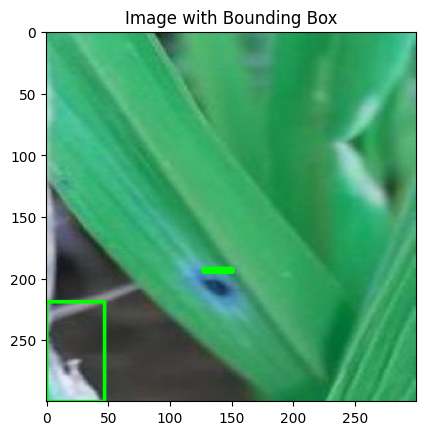

In [23]:
# Function to create bounding box based on heatmap
def create_bounding_box(img_path, heatmap, threshold=0.5):
    # Load the original image
    original_img = cv2.imread(img_path)

    # Resize the heatmap to match the original image size
    heatmap_resized = cv2.resize(heatmap, (original_img.shape[1], original_img.shape[0]))

    # Threshold the heatmap to get the areas with high activation
    thresholded_heatmap = np.where(heatmap_resized > threshold, 1.0, 0.0)

    # Find contours in the thresholded heatmap
    contours, _ = cv2.findContours(np.uint8(thresholded_heatmap), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a copy of the original image to draw bounding boxes
    img_with_boxes = original_img.copy()

    # Iterate through contours and draw bounding boxes
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(img_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)

    return img_with_boxes

# Example usage:
img_path = '/content/drive/MyDrive/Skripsi - Plant Leaf/Dataset - PlantLeafDataset - Split/test/Padi_Brownspot/BROWNSPOT1_052.jpg'  # Replace with the path to your image
img_array = preprocess_input(get_img_array(img_path, size=img_size))
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Create and display the original image with bounding box
img_with_boxes = create_bounding_box(img_path, heatmap)
plt.imshow(img_with_boxes)
plt.title('Image with Bounding Box')
plt.show()

In [ ]:
import keras
from IPython.display import Image, display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

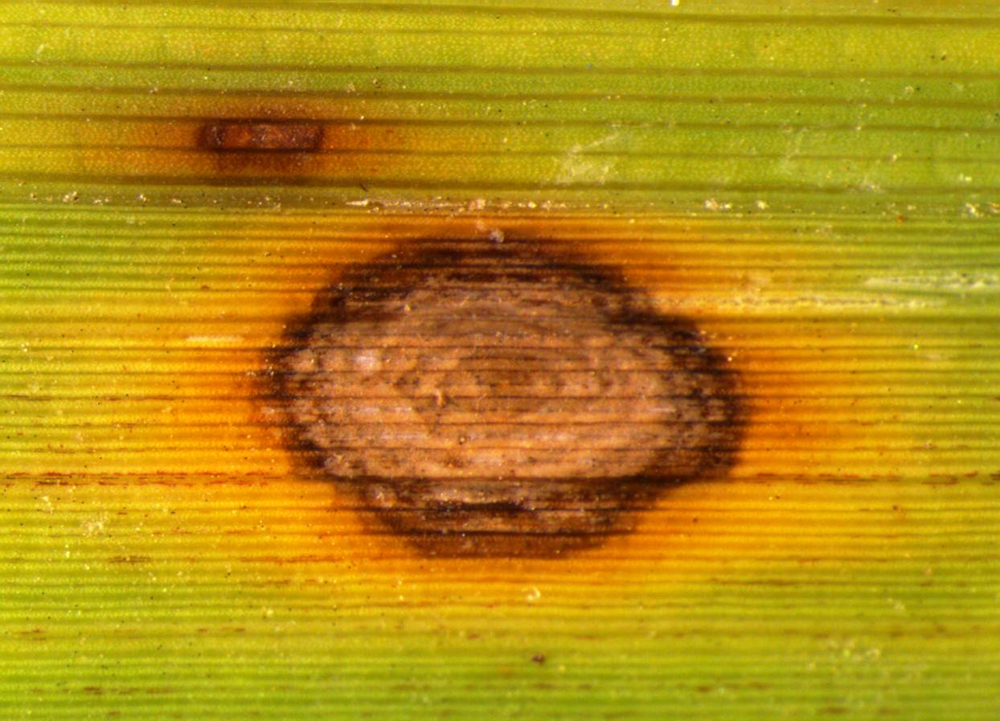

In [ ]:
# The local path to our target image
img_path = keras.utils.get_file(
    "brownspot.jpg", "https://www.lsuagcenter.com/~/media/system/a/d/8/5/ad8530570cba97948c70c60bf250afdc/brownspot3.jpg?h=897&la=en&w=1244"
)

display(Image(img_path))

1/1 [==============================] - 0s 78ms/step
Predicted Class Label: Class_2


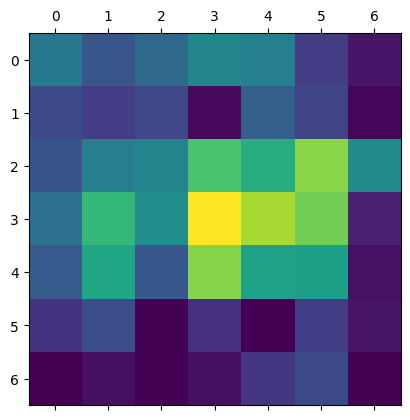

In [ ]:
from tensorflow.keras.applications.imagenet_utils import decode_predictions

# Prepare image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Remove last layer's softmax
model.layers[-1].activation = None

# Print the class index with the highest probability
preds = model.predict(img_array)
predicted_class_index = np.argmax(preds)

# You may need to map this index to your actual class labels
# This is just a placeholder for demonstration purposes
predicted_class_label = f'Class_{predicted_class_index}'

print("Predicted Class Label:", predicted_class_label)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=predicted_class_index)

# Display heatmap
plt.matshow(heatmap)
plt.show()

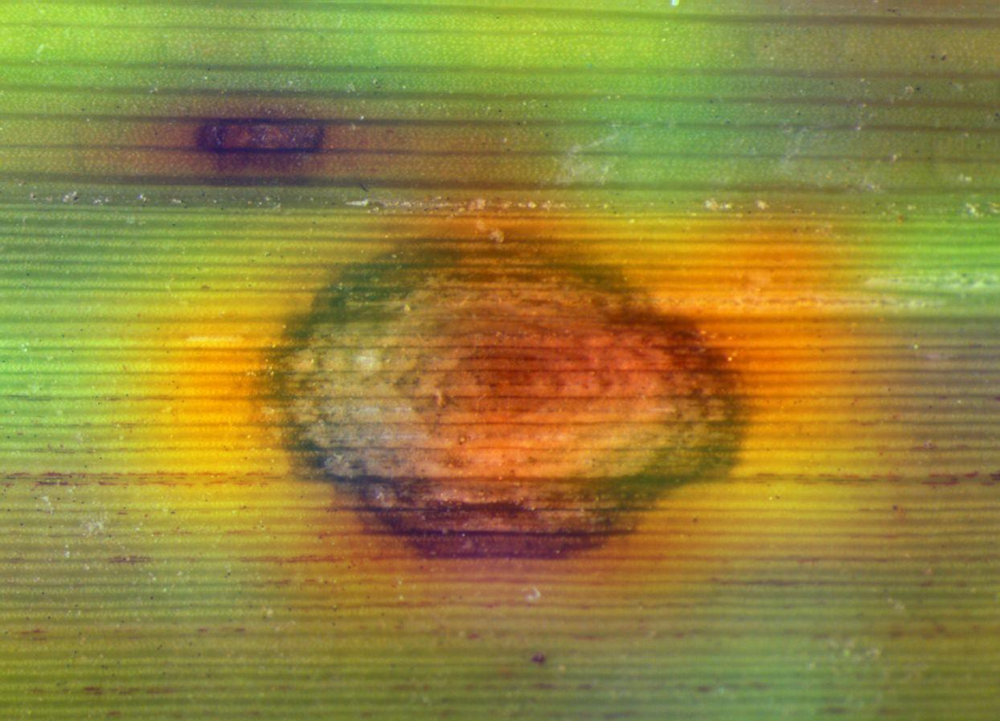

In [ ]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = mpl.colormaps["jet"]

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)

In [ ]:
look_model_1 = tf.keras.applications.EfficientNetV2B0(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

look_model_1.summary()

In [ ]:
look_model_2 = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

look_model_2.summary()